# Background
In this project, we will attempt to generate images in the style of Monet. We will be using the generative adversarial networks architecture, consisting of a generator and discriminator.
At first we will explore a simple vanilla GAN network, followed by more complex variations.


## Data Description
The competition's dataset is composed of 4 directories, 2 of which containing tfrec files, and the other 2 jpg files.

In addition to the differing formats, the directories are also seperated to monet style images, and regular photos.

The number of images provided are:

monet_jpg - 300

monet_tfrec - 5

photo_jpg - 7038

photo_tfrec - 20

The images are 256x256 in size with 3 channels (RGB).

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import os

import matplotlib.pyplot as plt
import tensorflow as tf
import keras

from tqdm import tqdm
from keras import layers, ops, initializers

from IPython.display import clear_output


INPUT_BASEPATH = "/kaggle/input/gan-getting-started"

# Loading the data

In [2]:
def get_filepaths(base_path, extension):
    paths = tf.io.gfile.glob(os.path.join(base_path,f'*.{extension}'))
    # for p in paths:
    #     yield p
    return paths

In [3]:
monet_tfrec_filepaths = get_filepaths(os.path.join(INPUT_BASEPATH,'monet_tfrec'), 'tfrec')
photo_tfrec_filepaths = get_filepaths(os.path.join(INPUT_BASEPATH,'photo_tfrec'), 'tfrec')
monet_jpg_filepaths = get_filepaths(os.path.join(INPUT_BASEPATH,'monet_jpg'), 'jpg')
photo_jpg_filepaths = get_filepaths(os.path.join(INPUT_BASEPATH,'photo_jpg'), 'jpg')

# EDA

In [4]:
print(f"Monet TFREC images count: {len(monet_tfrec_filepaths)}")
print(f"Photo TFREC images count: {len(photo_tfrec_filepaths)}")
print(f"Monet JPG images count: {len(monet_jpg_filepaths)}")
print(f"Photo JPG images count: {len(photo_jpg_filepaths)}")

Monet TFREC images count: 5
Photo TFREC images count: 20
Monet JPG images count: 300
Photo JPG images count: 7038


It seems like the TFREC datasets are quite small, so instead we will use the JPG datasets to train our GAN model

Also let's inspect some of the images

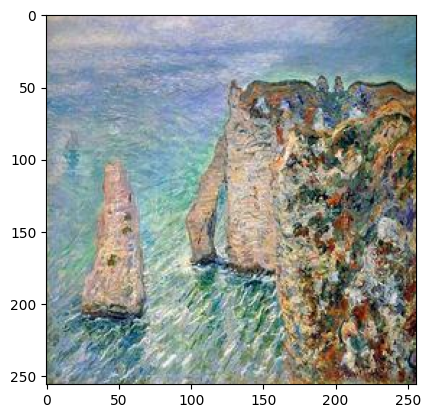

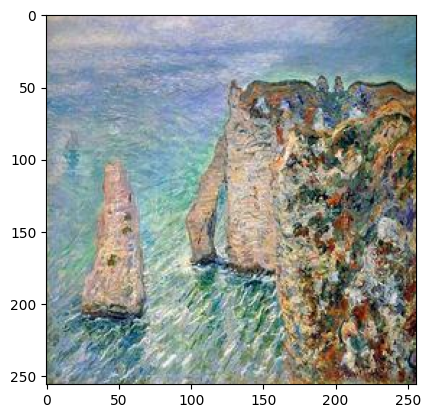

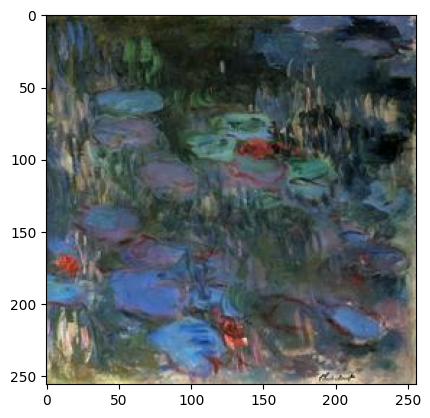

In [5]:
from random import choices
from PIL import Image

for sample_img in choices(monet_jpg_filepaths, k=3):
    plt.imshow(Image.open(sample_img))
    plt.show()

Let's inspect the non-monet images as well

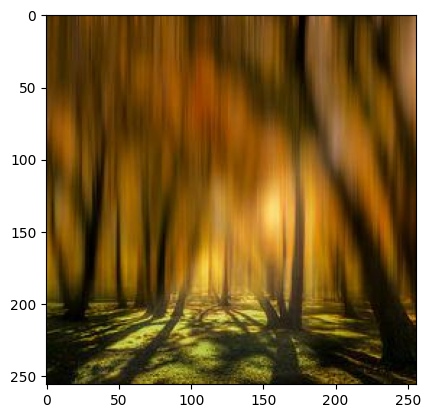

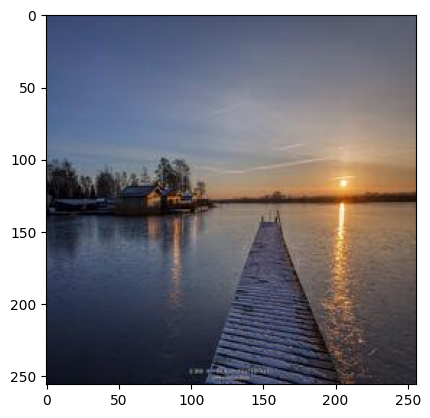

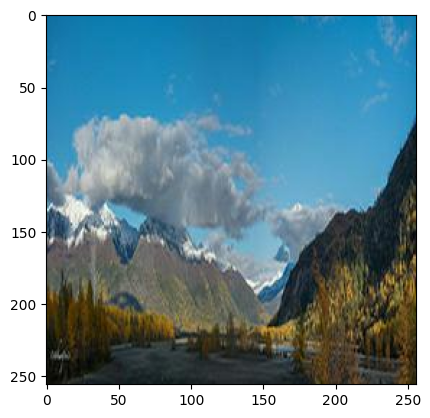

In [6]:

for sample_img in choices(photo_jpg_filepaths, k=3):
    plt.imshow(Image.open(sample_img))
    plt.show()

In [7]:
def mean_color_distribution(img_filepaths):
        
    mean_channel_values = {
        'R' : [],
        'G' : [],
        'B' : []
    }
    
    for img_path in tqdm(img_filepaths):
        for channel in mean_channel_values:
            img = Image.open(img_path)
            mean_channel_values[channel].append(np.array(img.getchannel(channel)).mean())
        

    df_rgb = pd.DataFrame(mean_channel_values)
    print(df_rgb.mean())
    print(df_rgb.std())
    df_rgb.replace([np.inf, -np.inf], np.nan, inplace=True)
    
    sns.histplot(df_rgb['R'], bins=20, kde=True, label='R', color='red')
    sns.histplot(df_rgb['G'], bins=20, kde=True, label='G', color='green')
    sns.histplot(df_rgb['B'], bins=20, kde=True, label='B', color='blue')
    plt.legend()
    plt.show()

100%|██████████| 300/300 [00:02<00:00, 107.42it/s]
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


R    132.963005
G    133.727880
B    121.572679
dtype: float64
R    28.756461
G    28.997153
B    36.119315
dtype: float64


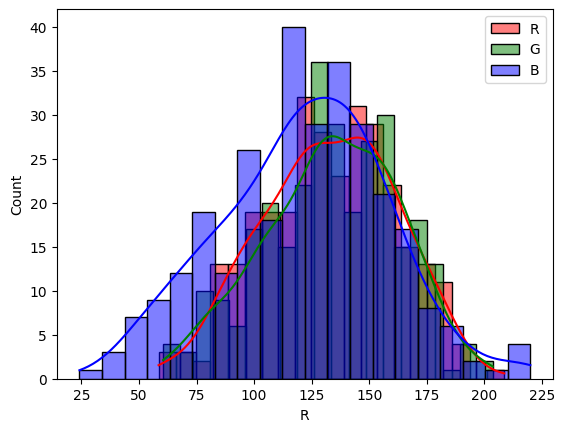

In [8]:
mean_color_distribution(monet_jpg_filepaths)

It's really interesting to see the color distribution shows a tendency for less blue color in monet paintings on average, but with much higher variance than the other colors. After looking it up I found the following relevant article:
https://www.forthepeoplecollective.org/monets-use-of-blue-in-his-paintings/

100%|██████████| 1000/1000 [00:08<00:00, 114.17it/s]


R    102.861066
G    104.138046
B     96.626995
dtype: float64
R    36.456284
G    34.998881
B    39.022247
dtype: float64


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


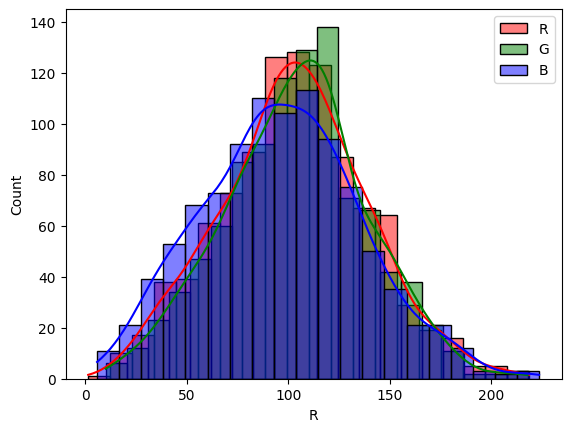

In [9]:
mean_color_distribution(choices(photo_jpg_filepaths,k=1000))

On the other hand, in a sampled set of the real photos the colors are a bit more balanced.

# Model Architecture

We will first test a vanilla GAN network, since our images are pretty large (256x256), we will attempt to generate a resized smaller version of them.

## Vanilla GAN

A vanilla GAN consists of two neural networks, a generator and a discriminator, competing with each other. The generator creates synthetic data, while the discriminator tries to distinguish between real and synthetic data.

We will start with simple fully connected networks for the generator and discriminator.

In [10]:
# discriminator = keras.Sequential(
#     [
#         keras.Input(shape=(256, 256, 3)),
#         layers.Resizing(64,64),
#         layers.Flatten(),
        
#         layers.Dense(1024),
#         layers.BatchNormalization(),
#         layers.LeakyReLU(negative_slope=0.2),
#         layers.Dropout(0.5),
        
#         layers.Dense(512),
#         layers.BatchNormalization(),
#         layers.LeakyReLU(negative_slope=0.2),
#         layers.Dropout(0.5),
        
#         layers.Dense(256),
#         layers.BatchNormalization(),
#         layers.LeakyReLU(negative_slope=0.2),
#         layers.Dropout(0.5),
        
#         layers.Dense(1, activation="sigmoid"),
#     ],
#     name="discriminator_dense",
# )
# discriminator.summary()

In [11]:
# latent_dim = 128

# generator = keras.Sequential(
#     [
#         keras.Input(shape=(latent_dim,)),
        
#         layers.Dense(256),
#         layers.BatchNormalization(),
#         layers.LeakyReLU(negative_slope=0.2),
#         layers.Dropout(0.2),

#         layers.Dense(512),
#         layers.BatchNormalization(),
#         layers.LeakyReLU(negative_slope=0.2),
#         layers.Dropout(0.2),

#         layers.Dense(1024),
#         layers.BatchNormalization(),
#         layers.LeakyReLU(negative_slope=0.2),
#         layers.Dropout(0.2),

#         layers.Dense(64 * 64 * 3, activation="sigmoid"),
#         layers.Reshape((64,64,3))

        
#     ],
#     name="generator_dense",
# )
# generator.summary()

In [12]:
class GAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim, limit_d_loss=None):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        self.seed_generator = keras.random.SeedGenerator(42)
        self.freeze_discriminator = False
        self.limit_d_loss = limit_d_loss

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super().compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    @tf.function
    def train_step(self, real_images):
        # Sample random points in the latent space
        batch_size = ops.shape(real_images)[0]
        random_latent_vectors = keras.random.normal(
            shape=(batch_size, self.latent_dim), seed=self.seed_generator
        )

        with tf.GradientTape() as d_tape, tf.GradientTape() as g_tape:
            # Generate a fake image with the generator
            generated_images = self.generator(random_latent_vectors, training=True)

            # Determine the outputs of the discriminator for the fake and a real image
            discriminator_fake_output = self.discriminator(generated_images,  training=True)
            discriminator_real_output = self.discriminator(real_images, training=True)
            
            # Calculate losses for discriminator
            generated_image_loss = self.loss_fn(ops.ones((batch_size, 1)), discriminator_fake_output)
            real_image_loss = self.loss_fn(ops.zeros((batch_size, 1)), discriminator_real_output)

            # Discriminator loss
            d_loss = generated_image_loss + real_image_loss

            # Experimental conditional training, to avoid the discriminator throwing off the model
            if self.freeze_discriminator or (self.limit_d_loss and d_loss < self.limit_d_loss):
                pass # We're skipping the weights update in these cases that limit the discriminator
            else:
                d_grads = d_tape.gradient(d_loss, self.discriminator.trainable_weights)
    
                self.d_optimizer.apply_gradients(
                    zip(d_grads, self.discriminator.trainable_weights)
                )

            # Generator loss
            g_loss = self.loss_fn(ops.zeros((batch_size, 1)), discriminator_fake_output)
            g_grads = g_tape.gradient(g_loss, self.generator.trainable_weights)
            self.g_optimizer.apply_gradients(zip(g_grads, self.generator.trainable_weights))

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

In [13]:
# gan_preview_images_dir = './progress_images/'
# if not os.path.exists(gan_preview_images_dir):
#     os.makedirs(gan_preview_images_dir)


class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=1, latent_dim=128, preview_freq=3):
        """
        A combined Keras callback to:
        1. Generate and save preview images every 'preview_freq' epochs
        2. Plot generator and discriminator losses every 'plot_interval' epochs

        Args:
            num_img (int): Number of preview images to generate per epoch.
            latent_dim (int): Latent dimension for the generator.
            preview_freq (int): Epoch frequency to generate preview images and loss plots.
        """
        super().__init__()
        self.num_img = num_img
        self.latent_dim = latent_dim
        self.preview_freq = preview_freq
        self.seed_generator = keras.random.SeedGenerator(42)

        # Loss plotting components
        self.gen_losses = []
        self.disc_losses = []
        self.epoch_count = 0

    def on_epoch_end(self, epoch, logs=None):
        self.epoch_count += 1


        # Preview during training every few epochs
        if self.preview_freq and epoch % self.preview_freq == 0:
            # 1. Image Generation and Preview
            random_latent_vectors = keras.random.normal(
                shape=(self.num_img, self.latent_dim), seed=self.seed_generator
            )
            generated_images = self.model.generator(random_latent_vectors, training=False)

            # generated_images += 1
            # generated_images /= 2
            generated_images *= 255
            generated_images_np = generated_images.numpy() # Convert to numpy once

            for i in range(self.num_img):
                img = keras.utils.array_to_img(generated_images_np[i]).resize((256,256))
                #img.save(os.path.join(gan_preview_images_dir,f"generated_img_epoch_{epoch:03d}_img_{i:02d}.png"))
                display(img)

        # 2. Loss Plotting
            gen_loss = logs.get('g_loss')
            disc_loss = logs.get('d_loss')

            if gen_loss and disc_loss: # Check if losses are available
                self.gen_losses.append(gen_loss)
                self.disc_losses.append(disc_loss)
                self.plot_losses()

    def plot_losses(self):
        plt.figure(figsize=(5, 3))
        plt.plot(self.gen_losses, label='Generator Loss')
        plt.plot(self.disc_losses, label='Discriminator Loss')
        plt.xlabel(f'Epochs (x{self.preview_freq})')
        plt.ylabel('Loss')
        plt.title('GAN Loss During Training')
        plt.legend()
        plt.grid(True)
        #plt.savefig('gan_loss_plot_epochs.png')
        plt.show()


In [14]:
batch_size = 128

In [15]:
dataset = keras.utils.image_dataset_from_directory(
    os.path.join(INPUT_BASEPATH,'monet_jpg'),
    labels=None,
    shuffle=True,
    batch_size=batch_size
)

dataset = dataset.map(lambda x: x / 255.0)



Found 300 files.


In [16]:
# g_lr = 2e-4
# d_lr = 2e-4

# gan = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

# #########################
# #gan.freeze_discriminator = True # Testing
# #########################

# gan.compile(
#     d_optimizer=keras.optimizers.Adam(learning_rate=d_lr, beta_1=0.5, clipnorm=1),
#     g_optimizer=keras.optimizers.Adam(learning_rate=g_lr, beta_1=0.5, clipnorm=1),
#     loss_fn=keras.losses.BinaryCrossentropy(),
# )

In [17]:
#checkpoint_dir = './gan_checkpoints'
#checkpoint_callback = keras.callbacks.ModelCheckpoint(os.path.join(checkpoint_dir,'dcgan_checkpoint.model.keras'), save_freq='epoch')

In [18]:
# epochs = 2000
# history = gan.fit(
#     dataset, epochs=epochs, callbacks=[GANMonitor(num_img=3, preview_freq=epochs//10,latent_dim=latent_dim)]
# )

Generate a few images and see what is the model's output

In [19]:
# random_latent_vectors = keras.random.normal(
#       shape=(8, latent_dim), seed=42
# )
# generated_images = gan.generator(random_latent_vectors, training=False)

# for img in generated_images:
#     display(keras.utils.array_to_img(img).resize((256,256)))

It looks like the network is catching on some interesting patterns such as using a pallete of similar colors, and having some shaded parts in the generated image. Overall not too bad!

# DCGAN

DCGANs (Deep Convolutional GANs) leverage convolutional layers in both the generator and discriminator, enabling them to learn hierarchical feature representations. This leads to more stable training and the generation of higher-quality images compared to vanilla GANs.
In this architecture we utilize the Conv2DTranspose layer to upsample the initial image.

In [20]:
discriminator = keras.Sequential(
    [
        keras.Input(shape=(256, 256, 3)),
        
        layers.Conv2D(32, kernel_size=3, strides=2, padding="same", kernel_initializer=initializers.RandomNormal(stddev=0.02)),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Dropout(0.5),
        
        layers.Conv2D(64, kernel_size=3, strides=2, padding="same", kernel_initializer=initializers.RandomNormal(stddev=0.02)),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Dropout(0.5),
        
        layers.Conv2D(128, kernel_size=3, strides=2, padding="same", kernel_initializer=initializers.RandomNormal(stddev=0.02)),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Dropout(0.5),
        
        layers.Flatten(),
        layers.Dense(1, activation="sigmoid"),
    ],
    name="discriminator_dcgan",
)
discriminator.summary()

Model: "discriminator_dcgan"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 128, 128, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 128, 128, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 128, 128, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128, 128, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 64, 64, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 64, 64, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 131072)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │         131,073 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 225,217 (879.75 KB)

 Trainable params: 224,769 (878.00 KB)

 Non-trainable params: 448 (1.75 KB)

In [21]:
latent_dim = 128

generator = keras.Sequential(
    [
        keras.Input(shape=(latent_dim,)),
        layers.Dense(8 * 8 * 1024, use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),

        layers.Reshape((8, 8, 1024)),
        
        layers.Conv2DTranspose(512, kernel_size=3, strides=2, use_bias=False, padding="same"),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Dropout(0.2),
        
        layers.Conv2DTranspose(256, kernel_size=3, strides=2, use_bias=False, padding="same"),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Dropout(0.2),
        
        layers.Conv2DTranspose(128, kernel_size=3, strides=2, use_bias=False, padding="same"),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Dropout(0.2),
        
        layers.Conv2DTranspose(64, kernel_size=3, strides=2, use_bias=False, padding="same"),
        layers.BatchNormalization(),
        layers.LeakyReLU(negative_slope=0.2),
        layers.Dropout(0.2),

        layers.Conv2DTranspose(3, kernel_size=3, strides=2, use_bias=False, padding="same", activation="sigmoid"),

        
        #layers.Conv2D(3, kernel_size=5, padding="same", activation="sigmoid"),
    ],
    name="generator_dcgan",
)
generator.summary()

Model: "generator_dcgan"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_1 (Dense)                      │ (None, 65536)               │       8,388,608 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 65536)               │         262,144 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 65536)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 8, 8, 1024)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 16, 16, 512)         │       4,718,592 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 16, 16, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_4 (LeakyReLU)            │ (None, 16, 16, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 16, 16, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 32, 32, 256)         │       1,179,648 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 32, 32, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_5 (LeakyReLU)            │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_2 (Conv2DTranspose) │ (None, 64, 64, 128)         │         294,912 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_6 (LeakyReLU)            │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_3 (Conv2DTranspose) │ (None, 128, 128, 64)        │          73,728 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_7 (LeakyReLU)            │ (None, 128, 128, 64)        │              

 Total params: 14,923,200 (56.93 MB)

 Trainable params: 14,790,208 (56.42 MB)

 Non-trainable params: 132,992 (519.50 KB)

In [22]:
g_lr = 1e-4
d_lr = 1e-4

dc_gan = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

#########################
#gan.freeze_discriminator = True # Testing
#########################

dc_gan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=d_lr, beta_1=0.5, clipnorm=1),
    g_optimizer=keras.optimizers.Adam(learning_rate=g_lr, beta_1=0.5, clipnorm=1),
    loss_fn=keras.losses.BinaryCrossentropy(),
)

Epoch 1/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - d_loss: 1.7530 - g_loss: 0.9857   

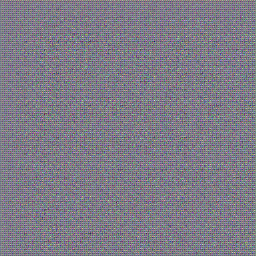

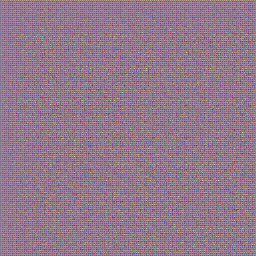

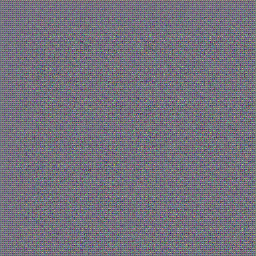

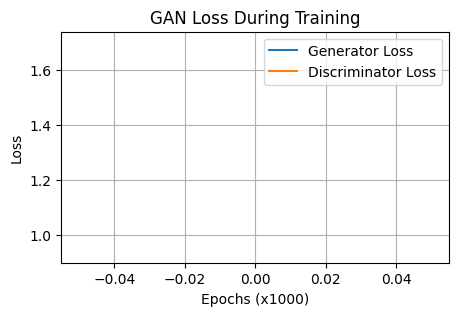

3/3 ━━━━━━━━━━━━━━━━━━━━ 52s 9s/step - d_loss: 1.7400 - g_loss: 0.9736
Epoch 2/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 1.5998 - g_loss: 1.0701
Epoch 3/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 1.3931 - g_loss: 1.3601
Epoch 4/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 1.1127 - g_loss: 1.4743
Epoch 5/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 0.9480 - g_loss: 1.7615
Epoch 6/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 0.9848 - g_loss: 1.7231
Epoch 7/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 1.0006 - g_loss: 1.5998
Epoch 8/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 1.2872 - g_loss: 1.4933
Epoch 9/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 1.3405 - g_loss: 1.6288
Epoch 10/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 1.4106 - g_loss: 1.4331
Epoch 11/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 1.2464 - g_loss: 1.8423
Epoch 12/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d

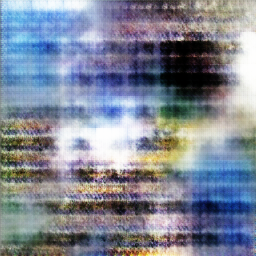

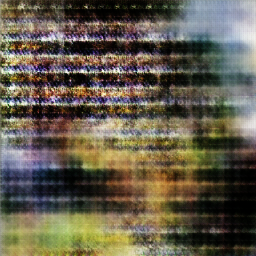

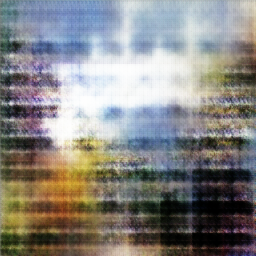

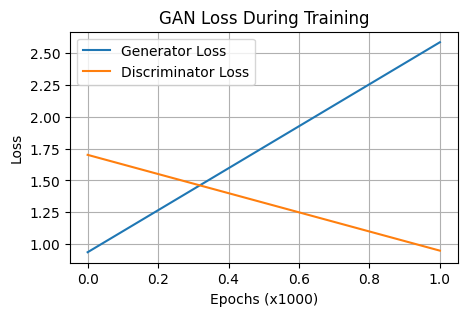

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 461ms/step - d_loss: 0.8924 - g_loss: 2.4700
Epoch 1002/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.8449 - g_loss: 2.4109
Epoch 1003/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.6613 - g_loss: 2.9961
Epoch 1004/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.7687 - g_loss: 2.5248
Epoch 1005/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.7877 - g_loss: 2.6359
Epoch 1006/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 220ms/step - d_loss: 0.8041 - g_loss: 2.5233
Epoch 1007/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.7574 - g_loss: 3.1617
Epoch 1008/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.8224 - g_loss: 2.2808
Epoch 1009/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.8266 - g_loss: 2.9517
Epoch 1010/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.7899 - g_loss: 2.3976
Epoch 1011/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 0.6667 - g_loss: 3.4504
Epoch 1012/10000
3/3 ━━━━━━

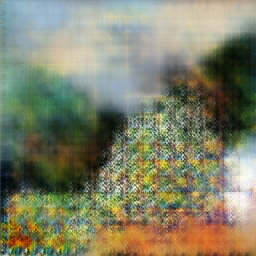

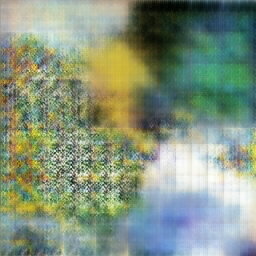

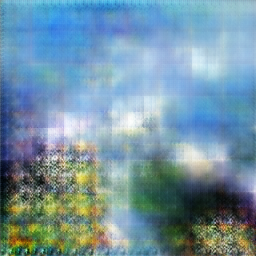

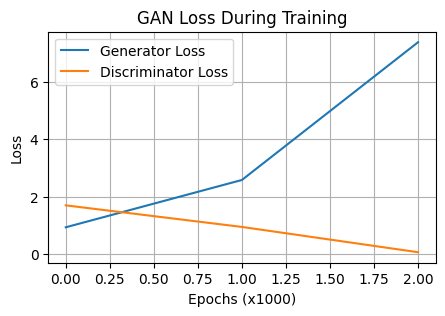

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 332ms/step - d_loss: 0.0458 - g_loss: 7.9589
Epoch 2002/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 0.2105 - g_loss: 8.6522
Epoch 2003/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 0.7341 - g_loss: 5.2490
Epoch 2004/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.2146 - g_loss: 7.6545
Epoch 2005/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 0.3248 - g_loss: 4.5258
Epoch 2006/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 0.2192 - g_loss: 6.7189
Epoch 2007/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 0.0592 - g_loss: 8.0743
Epoch 2008/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 0.1489 - g_loss: 6.8443
Epoch 2009/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.1252 - g_loss: 7.7371
Epoch 2010/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 0.2411 - g_loss: 8.2662
Epoch 2011/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.0877 - g_loss: 8.3660
Epoch 2012/10000
3/3 ━━━━━━

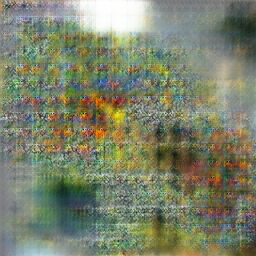

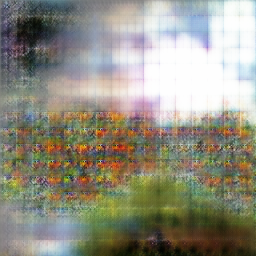

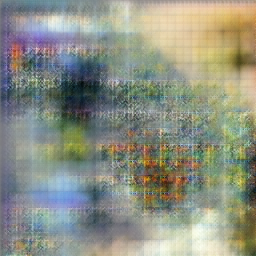

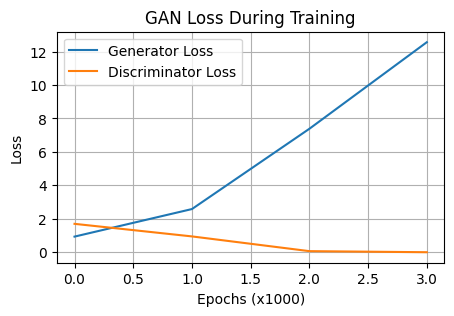

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 342ms/step - d_loss: 0.0066 - g_loss: 11.6036
Epoch 3002/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 0.0083 - g_loss: 13.2030
Epoch 3003/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 220ms/step - d_loss: 0.0163 - g_loss: 13.4865
Epoch 3004/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.0116 - g_loss: 11.8066
Epoch 3005/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.1154 - g_loss: 9.1221
Epoch 3006/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 220ms/step - d_loss: 0.4295 - g_loss: 7.7983
Epoch 3007/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.0070 - g_loss: 12.4394
Epoch 3008/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.0049 - g_loss: 12.9523
Epoch 3009/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.0084 - g_loss: 14.0806
Epoch 3010/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.0092 - g_loss: 11.5443
Epoch 3011/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.1281 - g_loss: 8.5512
Epoch 3012/10000
3/

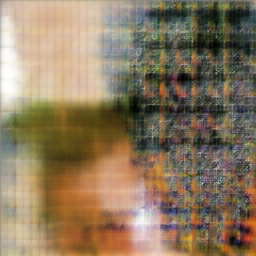

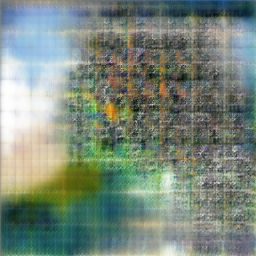

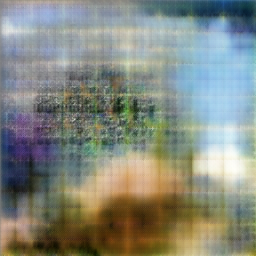

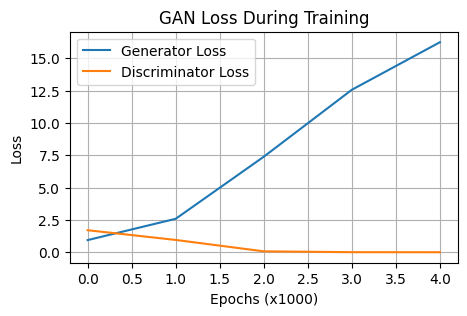

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 345ms/step - d_loss: 1.5645e-04 - g_loss: 16.2677
Epoch 4002/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.1331 - g_loss: 20.1275
Epoch 4003/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.0042 - g_loss: 17.3536
Epoch 4004/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 0.0386 - g_loss: 13.0222
Epoch 4005/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.0171 - g_loss: 14.9738
Epoch 4006/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 0.0081 - g_loss: 19.6540
Epoch 4007/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 0.0542 - g_loss: 16.6890
Epoch 4008/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 1.9361e-04 - g_loss: 18.6384
Epoch 4009/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 2.1621e-04 - g_loss: 15.0559
Epoch 4010/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 2.2968e-04 - g_loss: 18.5861
Epoch 4011/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.0012 - g_loss: 18.2974


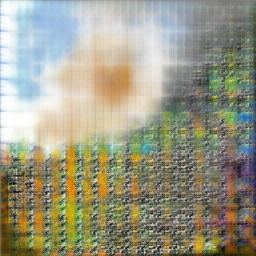

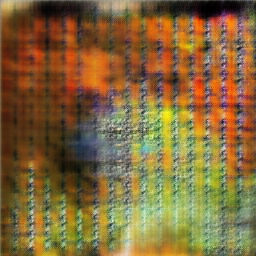

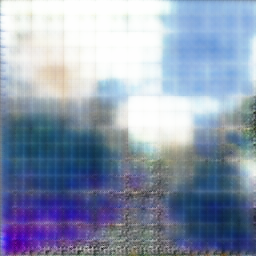

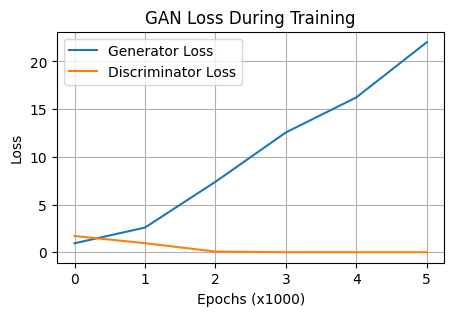

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 327ms/step - d_loss: 1.3881e-04 - g_loss: 20.3992
Epoch 5002/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 3.2018e-05 - g_loss: 19.0454
Epoch 5003/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 1.9824e-06 - g_loss: 20.8009
Epoch 5004/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 9.3366e-05 - g_loss: 18.6020
Epoch 5005/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.0026 - g_loss: 25.1612
Epoch 5006/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.0106 - g_loss: 21.9560
Epoch 5007/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 0.0016 - g_loss: 19.9721
Epoch 5008/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 0.0097 - g_loss: 19.1660
Epoch 5009/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.0152 - g_loss: 19.9745
Epoch 5010/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.0120 - g_loss: 17.3478
Epoch 5011/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 9.5544e-04 - g_loss: 22.4

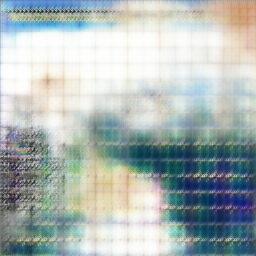

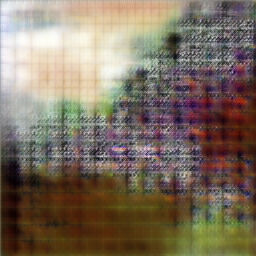

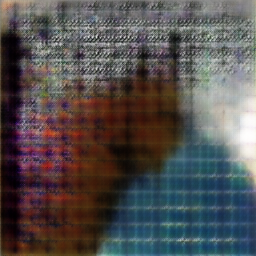

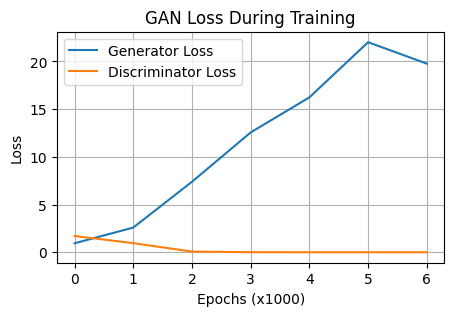

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 332ms/step - d_loss: 1.1574e-04 - g_loss: 21.0227
Epoch 6002/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 3.1420e-05 - g_loss: 27.6250
Epoch 6003/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 1.6982e-04 - g_loss: 21.4862
Epoch 6004/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.0568 - g_loss: 22.2003
Epoch 6005/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 0.0118 - g_loss: 20.0514
Epoch 6006/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 1.6149e-04 - g_loss: 18.7222
Epoch 6007/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 1.1910e-04 - g_loss: 23.0239
Epoch 6008/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 2.3857e-05 - g_loss: 20.5919
Epoch 6009/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 1.9343e-05 - g_loss: 23.1626
Epoch 6010/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.0252 - g_loss: 17.8803
Epoch 6011/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.0139 - g_lo

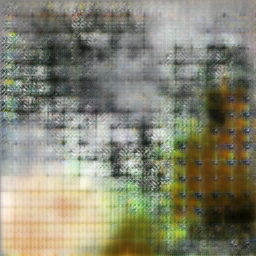

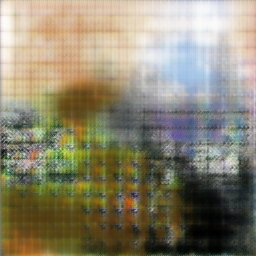

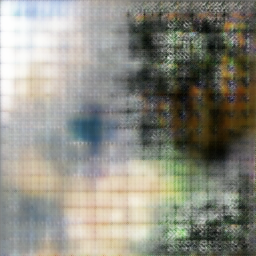

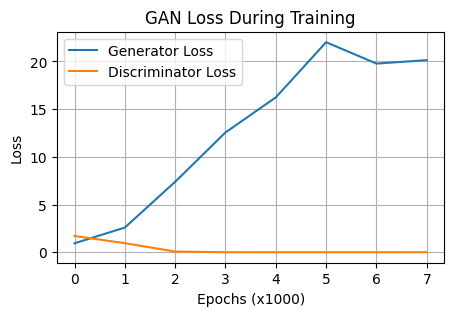

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 340ms/step - d_loss: 0.0025 - g_loss: 22.1493
Epoch 7002/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 220ms/step - d_loss: 0.0023 - g_loss: 30.6779
Epoch 7003/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 3.1440e-04 - g_loss: 32.7556
Epoch 7004/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 220ms/step - d_loss: 1.6671e-05 - g_loss: 22.7047
Epoch 7005/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 221ms/step - d_loss: 9.5690e-05 - g_loss: 27.8465
Epoch 7006/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 220ms/step - d_loss: 0.0082 - g_loss: 23.0061
Epoch 7007/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 220ms/step - d_loss: 0.0228 - g_loss: 24.6111
Epoch 7008/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 220ms/step - d_loss: 2.8825e-04 - g_loss: 20.5498
Epoch 7009/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 221ms/step - d_loss: 0.0031 - g_loss: 25.5581
Epoch 7010/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 221ms/step - d_loss: 0.0110 - g_loss: 29.0214
Epoch 7011/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.0023 - g_loss: 25.0421


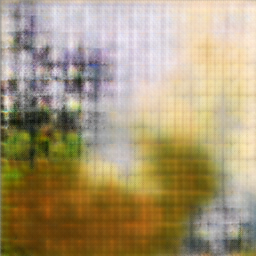

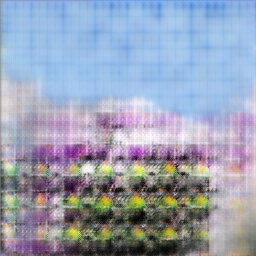

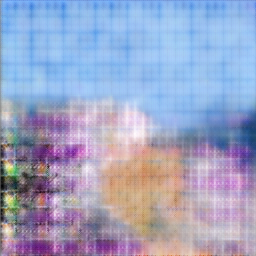

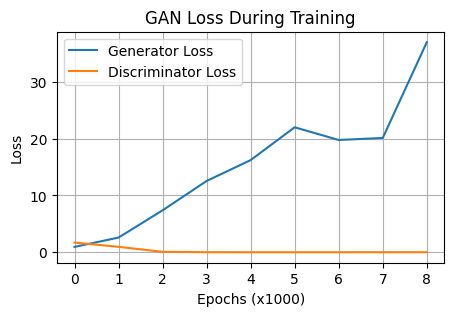

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 333ms/step - d_loss: 1.3968e-04 - g_loss: 39.1581
Epoch 8002/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 1.5683e-07 - g_loss: 28.4544
Epoch 8003/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 5.2196e-05 - g_loss: 27.9169
Epoch 8004/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 2.2377e-07 - g_loss: 29.7215
Epoch 8005/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 2.3575e-04 - g_loss: 30.0919
Epoch 8006/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 2.9055e-06 - g_loss: 32.8328
Epoch 8007/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 220ms/step - d_loss: 1.5857e-04 - g_loss: 29.6187
Epoch 8008/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 1.7927e-06 - g_loss: 26.9709
Epoch 8009/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 1.7231e-05 - g_loss: 22.3719
Epoch 8010/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 4.7542e-06 - g_loss: 26.7208
Epoch 8011/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 0

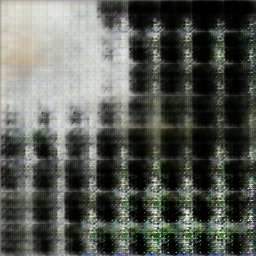

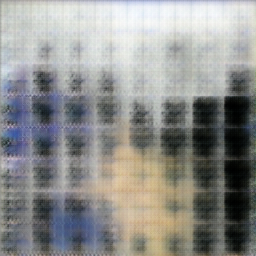

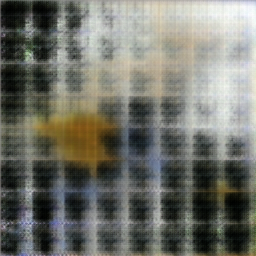

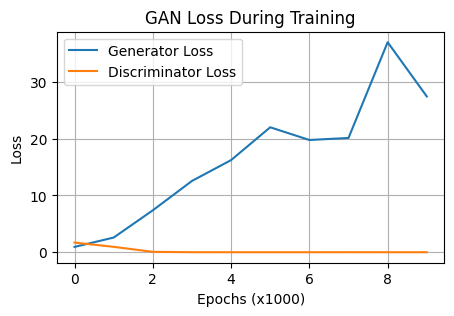

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 325ms/step - d_loss: 9.9976e-05 - g_loss: 26.5208
Epoch 9002/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 0.0099 - g_loss: 29.0813
Epoch 9003/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.0949 - g_loss: 31.9725
Epoch 9004/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 6.1446e-06 - g_loss: 30.5630
Epoch 9005/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - d_loss: 4.5198e-05 - g_loss: 23.2306
Epoch 9006/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 7.5915e-07 - g_loss: 26.2366
Epoch 9007/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.0056 - g_loss: 23.2739
Epoch 9008/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.5105 - g_loss: 23.9500
Epoch 9009/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 3.6823e-05 - g_loss: 31.8951
Epoch 9010/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 0.0423 - g_loss: 29.9595
Epoch 9011/10000
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - d_loss: 2.7550e-04 - g_loss: 

In [23]:
epochs = 10_000
history = dc_gan.fit(
    dataset, epochs=epochs, callbacks=[GANMonitor(num_img=3, preview_freq=epochs//10,latent_dim=latent_dim)]
)

In [24]:
# Experimental, training the generator only for a couple epochs more
# gen_epochs = 10
# dc_gan.freeze_discriminator = True
# history_gen = dc_gan.fit(
#     dataset, epochs=gen_epochs, callbacks=[GANMonitor(num_img=3, preview_freq=1,latent_dim=latent_dim)]
# )

Generate a few images and see what is the model's output

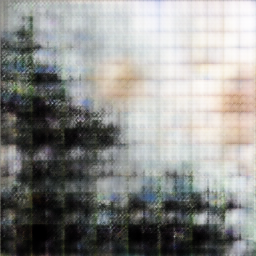

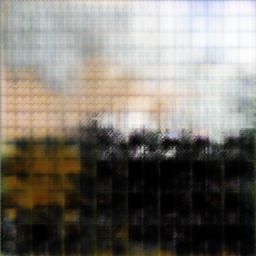

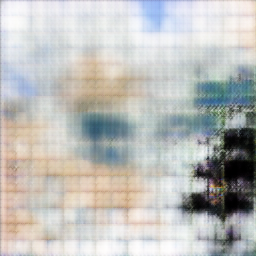

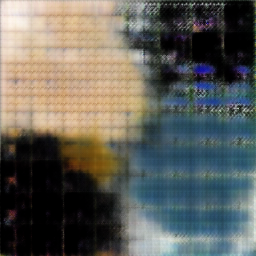

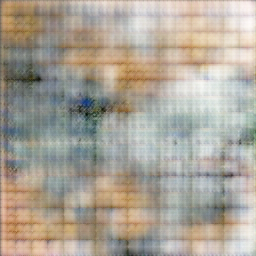

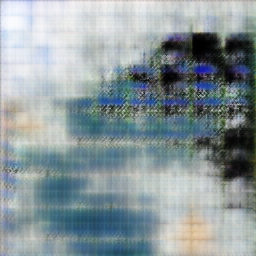

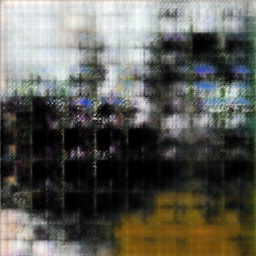

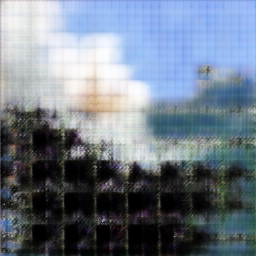

In [25]:
random_latent_vectors = keras.random.normal(
      shape=(8, latent_dim), seed=42
)
generated_images = dc_gan.generator(random_latent_vectors, training=False)

for img in generated_images:
    display(keras.utils.array_to_img(img).resize((256,256)))

I have attempted many different weaks of this DCGAN network, and have failed to generate any decent looking images.
Most of the attempts have resulted in the generator loss going up and keep rising.

The best looking images generated during training had some cloud looking patterns to them, and this was achieved by limiting the discriminator in an attempt to stop it from overpowering the generator.

# Evaluating and saving the resulting images

In [26]:
batches=60
output_dir='images'

if not os.path.exists(output_dir):
    os.mkdir(output_dir)

for i in range(batches):

  random_latent_vectors = keras.random.normal(
      shape=(batch_size, latent_dim), seed=42
  )
  generated_images = dc_gan.generator(random_latent_vectors)
  for j,img in enumerate(generated_images):
      keras.utils.array_to_img(img).resize((256,256)).save(os.path.join(output_dir,f"batch_{i}_img_{j}.jpg"))


In [27]:
import zipfile

def zip_folder(folder_path, output_zip_path):
    """
    Zips a folder and its contents.

    Args:
        folder_path: The path to the folder to zip.
        output_zip_path: The path to the output zip file.  If the file
                         exists, it will be overwritten.
    Raises:
        FileNotFoundError: If the folder_path does not exist.
        ValueError: If `folder_path` is not a directory.
    """

    if not os.path.exists(folder_path):
        raise FileNotFoundError(f"Folder '{folder_path}' not found.")

    if not os.path.isdir(folder_path):
        raise ValueError(f"'{folder_path}' is not a directory.")

    try:
        with zipfile.ZipFile(output_zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
            for root, _, files in os.walk(folder_path):
                for file in files:
                    file_path = os.path.join(root, file)
                    arcname = os.path.relpath(file_path, folder_path)  # Important for correct paths within the archive
                    zipf.write(file_path, arcname=arcname)
        print(f"Folder '{folder_path}' zipped successfully to '{output_zip_path}'")

    except Exception as e:
        print(f"An error occurred during zipping: {e}")



In [28]:
zip_folder(output_dir,'images.zip')

Folder 'images' zipped successfully to 'images.zip'


In [29]:
!rm -rf images

# Conclusions



In this notebook, we implemented a vanilla GAN and a DCGAN network to generate images resembling Monet's style.

We observed the training process through generated image previews and loss plots,

showcasing the evolution of the generator's ability to mimic the artistic style.

It was tremendously challenging to achieve any stable training proccess, and to generate images that are not complete noise.

Part of the challenge was the delicate balance between the generator and discriminator, and part of it was lack of hardware.

Further improvements could involve exploring advanced architectures (CycleGAN, BigGAN),
hyperparameter tuning, and experimenting with different loss functions to enhance image quality and fidelity to Monet's style.  The small dataset size might have limited the performance, and using a larger, more diverse dataset might yield superior results.


